# Plotting libraries

We mention a few plotting libraries:

- [Matplotlib](https://matplotlib.org/3.1.1/gallery/index.html) is for basic plotting, it is the classic library that can do 80% of your plots
- [Seaborn](https://seaborn.pydata.org/examples/index.html) is for statistical visualization 
- [Holoviews](http://holoviews.org/gallery/index.html) - very high-level tool for interactive dashboards and large data (when using datashader backend). Not as well-suited to making figures for publication.
    - Bokeh is usefull for interactive plotting but because it's browser based, it can struggle with large amounts of data, unless you use server-based plotting. We will use it as a Holoviews backend but it's worth looking into by itself.
    - Datashader is useul for plotting large quantity of data points. We will use it as a holoview backend

But the important thing is to get get good at one so you can easily produce plots. Matplotlib is the default choice unless you expect to need interactivity or large datasets.

Most plotting workflows start by finding an example and modifying it. For that we browse the galleries.

# Datashader
Datashader is a library that extends Bokeh and it is useul for plotting large quantity of data points. Using Datashader is highly recommended when dealing with more than a million data points, especially when other plotting libraries have trouble visualising the data. Datashader uses aggregation to visualise data, which means we are not seeing every single data point rather an aggregated form of the data. The output of datashader is an image, which can be used by other libraries. Holoviews is one of the packages which is based on bokeh and take advantage of Datashader for ploting large datasets.<br>
Datashader only supports a few types of plots:
- Scatter plots and heatmaps
- Trajectories
- Rasters

In [1]:
import datashader as ds

In [2]:
import pandas as pd
import numpy as np

np.random.seed(14)
n = 500000
df1 = pd.DataFrame(
    {
        "x": np.random.normal(0, 2, n),
        "y": np.random.normal(0, 2, n),
        "z": np.random.normal(1, 0.1, n),
        "cat": "A",
    }
)
df2 = pd.DataFrame(
    {
        "x": np.random.normal(3, 1, n),
        "y": np.random.normal(0, 1, n),
        "z": np.random.normal(5, 0.2, n),
        "cat": "B",
    }
)
df3 = pd.DataFrame(
    {
        "x": np.random.normal(-3, 1, n),
        "y": np.random.normal(2, 1, n),
        "z": np.random.normal(10, 0.5, n),
        "cat": "C",
    }
)

df = pd.concat([df1, df2, df3], ignore_index=True)
df["cat"] = df["cat"].astype("category")
df.head()

,x,y,z,cat
0,3.102678,1.147657,0.977741,A
1,0.158372,-0.146898,1.073777,A
2,0.347953,0.099332,0.983389,A
3,-0.144673,-0.518606,0.802015,A
4,-4.008659,-0.337430,1.174948,A


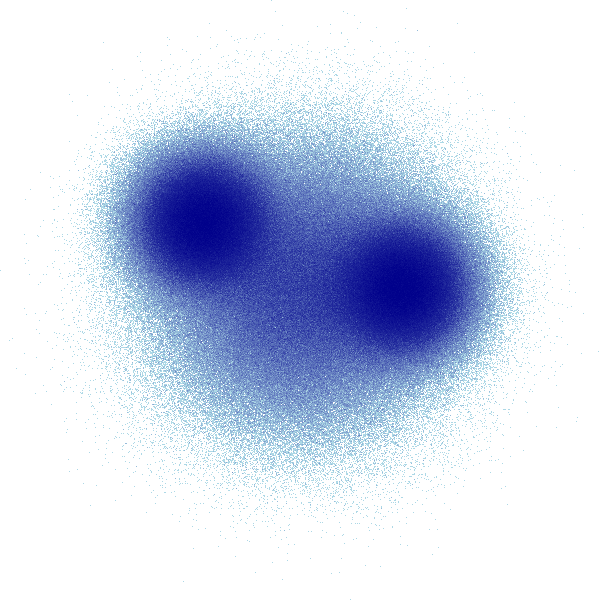

In [3]:
import datashader as ds
import datashader.transfer_functions as tf

tf.shade(ds.Canvas().points(df, "x", "y"))

## Datashader pipeline
Datashader follows these steps to generate an image from data:
1. Projection
2. Aggregation
3. Transformation
4. Colormapping
5. Embedding

Let's see how each step is done.

### Projection and Aggregation
Here, projection means choosing the features in the data we want to visualise. In a scatter plot we are going to have an x-axis and a y-axis, so we want to decide which column is going to be _x_ and which column is going to be _y_. Since datashader visualises an aggregated form of the data in an image, we also need to decide what aggregation function should be used. Datashader supports the following functions:
- `any()`: returns __*1*__ if any data point exists in the pixel, otherwise returns __*0*__.
- `count()`: returns the number of data points in each pixel.
- `count_cat()`: returns the number of data points for each category in each pixel.
- `sum()`: the total value of all the numbers in a pixel (we can also specify which column should be used).



First, we need to create an empty canvas.

In [4]:
canvas = ds.Canvas(plot_width=400, plot_height=400, x_range=(-5, 5), y_range=(-5, 5))

Then we pass in the data, the columns we want to use , and the aggregation function.

In [5]:
aggr = canvas.points(df, "x", "y", agg=ds.count())
aggr

<xarray.DataArray (y: 400, x: 400)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)
Coordinates:
  * x        (x) float64 -4.987 -4.963 -4.938 -4.912 ... 4.912 4.938 4.963 4.987
  * y        (y) float64 -4.987 -4.963 -4.938 -4.912 ... 4.912 4.938 4.963 4.987

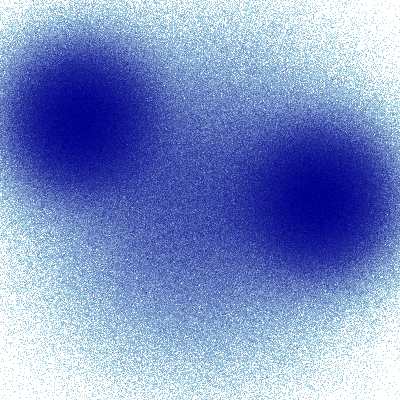

In [6]:
tf.shade(aggr)

### Transformation
In this step we apply any form of mathematical function if necessary. For instance, we may want to have only the top 10% values in the plot, or apply a `log` function to data.

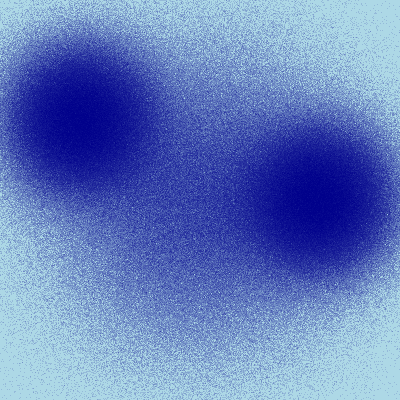

In [7]:
tf.shade(np.log(aggr + 1))

### Colormapping
Here we can select the colormap of the visualisation using Bokeh palettes.

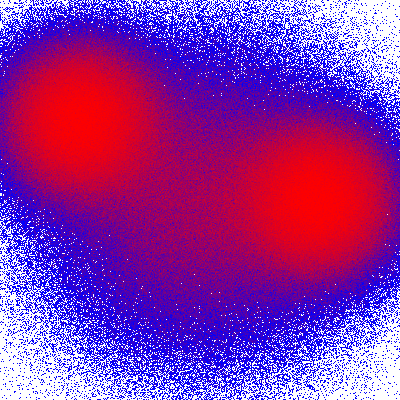

In [8]:
tf.shade(aggr, cmap=["blue", "red"])

When we are dealing with categorical variables we can assign a color to each category.

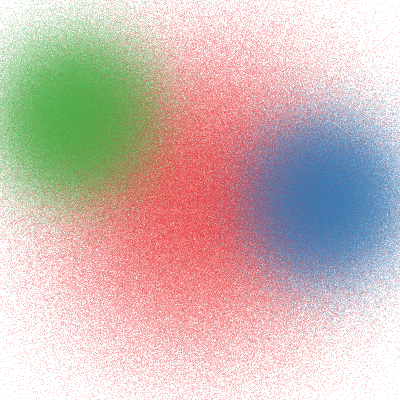

In [9]:
colors = {"A": "red", "B": "blue", "C": "green"}
aggr = canvas.points(df, "x", "y", agg=ds.count_cat("cat"))
tf.shade(aggr, colors)

We can make the points appear larger by spreading them.

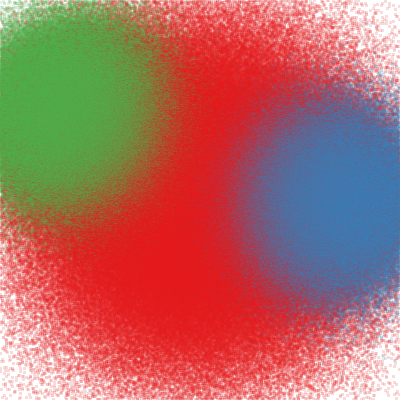

In [10]:
tf.spread(tf.shade(aggr, colors))

## With HoloViews
The image generated by datashader can be used like a normal image, or can be visualised via Holoviews. Using holoviews allows us to quickly render the image when we zoom in and out.

In [15]:
# Holoviews has a range of datashader operations available
from holoviews.operation.datashader import datashade, shade, dynspread, rasterize
from holoviews.operation import decimate

- rasterize: uses an aggregator and interpolation method to turn data into an image
- shade: normalise and colormaps to an image
- datashade: combines the two main computations done by datashader, namely shade() and rasterize():
- dynspread: dynamically makes isolated pixels "spread" into adjacent ones for visibility.

The primary one to use is datashade

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
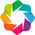

In [27]:
import holoviews as hv

hv.extension("bokeh")

colors = {"A": "red", "B": "blue", "C": "green"}
pts = hv.Points(df, ["x", "y"])
plot = datashade(pts, color_key=colors, aggregator=ds.count_cat("cat"))
# don't show pts, it will freeze your browser
# plot

In [42]:
# By itself this changes the color
rasterize(pts)

:DynamicMap   []
   :Image   [x,y]   (Count)

In [43]:
# rasterize + shade = datashade
shade(rasterize(pts)) + datashade(pts)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)
   .DynamicMap.II :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)

Spreading makes it easier to see when we zoom in on isolated points.

In [44]:
datashade(pts) + dynspread(datashade(pts))

:Layout
   .DynamicMap.I  :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)
   .DynamicMap.II :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)

<div class="alert alert-success">
<h2>Exercise</h2>

Use Holoviews with Datashader to view our smart meter data.
    
Use the code below replacing the `?` and entering your code where marked


```python
import pandas as pd
import datashader as ds
import datashader.transfer_functions as tf

# Load data
df = block0 = pd.read_csv("../../data/processed/smartmeter/block_0.csv", parse_dates=['day'], index_col=['day'])[['LCLid', 'energy_sum']]
print(df.head())

# Make it into points
pts = hv.Points(
    # YOUR CODE HERE
    ).opts(color='?')
colors = ['red', 'green', 'blue']*30 # We need 50+ colors, here's a quick way
plot = datashade(pts, color_key=colors, aggregator=ds.count_cat("?"))
plot
```


<details>
<summary><b>→ Hints</b></summary>

* View day as the x axis, energy_sum as the y axis
* Aggregate and color by LCLid

</details>

<br/>
<br/>
<details>
<summary>
<b>→ Solution</b>
</summary>

```python
import pandas as pd
import datashader as ds
import datashader.transfer_functions as tf

# Load data
df = block0 = pd.read_csv("../../data/processed/smartmeter/block_0.csv", parse_dates=['day'], index_col=['day'])[['LCLid', 'energy_sum']]
print(df.head())

# Make it into points
pts = hv.Points(df, ["day", "energy_sum"], vdims=['LCLid']).opts(color='LCLid')
colors = ['red', 'green', 'blue']*30
plot = datashade(pts, color_key=colors, aggregator=ds.count_cat("LCLid"))
plot
```

</details>

</div>

For more information on using datashader with holoviews see:
- http://holoviews.org/user_guide/Large_Data.html

You may also consider Bokeh server: https://docs.bokeh.org/en/latest/docs/user_guide/server.html